In [ ]:
!pip install gdown
!pip install ipython-autotime
!pip install googletrans==3.1.0a0
!pip install langdetect
!pip install translators
!pip install deep_translator

In [ ]:
%load_ext autotime

time: 123 µs (started: 2021-02-06 15:50:56 +00:00)


In [ ]:
!gdown "https://drive.google.com/uc?id=1WGb3OrqoIW3hdvovMowRDb2YqZuveOL5"

Downloading...
From: https://drive.google.com/uc?id=1WGb3OrqoIW3hdvovMowRDb2YqZuveOL5
To: /content/abstracts_processed.txt
688MB [00:03, 174MB/s]
time: 9.21 s (started: 2021-02-06 15:50:56 +00:00)


In [ ]:
import pandas as pd
import numpy as np
import nltk
import re
from nltk.corpus import stopwords
import json

nltk.download('stopwords')
pattern = re.compile(r'(,){2,}')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
time: 772 ms (started: 2021-02-06 15:51:05 +00:00)


In [ ]:
# loads the inverted abstracts and stores them as id-abstracts in a dictionary dic and in a folder fw
from tqdm import tqdm
tqdm.pandas()
pd.set_option("max_rows", 200000)

f = open("abstracts_processed.txt", "r")
dic = {}
for l in tqdm(f):
    splitted = l.split("----")
    if len(splitted) < 2:
        continue
    id, abstract = splitted
    abstract = re.sub(r",\n", "", abstract)
    dic[id] = abstract
f.close()

1056540it [00:08, 121347.27it/s]

time: 8.74 s (started: 2021-02-06 15:51:06 +00:00)


In [ ]:
print(len(dic))
# number of papers

1056539
time: 1.94 ms (started: 2021-02-06 15:51:14 +00:00)


In [ ]:
# Serialize data into file:
json.dump(dic, open("paper_id_to_abstract.json", "w"))

time: 8.65 s (started: 2021-02-06 15:51:14 +00:00)


In [ ]:
# Read data from file:
paper_id_to_abstract = json.load(open("paper_id_to_abstract.json"))

time: 3.92 s (started: 2021-02-06 15:51:23 +00:00)


In [ ]:
df_paper_to_abstract = pd.DataFrame(paper_id_to_abstract.items(), columns=["paper_id", "abstract"])
df_paper_to_abstract.set_index("paper_id", inplace=True)

time: 687 ms (started: 2021-02-06 15:51:27 +00:00)


In [ ]:
paper_ids = set(df_paper_to_abstract.index)
len(paper_ids)

1056539

time: 340 ms (started: 2021-02-06 15:51:28 +00:00)


In [ ]:
# remove first comma
df_paper_to_abstract["abstract"] = df_paper_to_abstract["abstract"].progress_apply(lambda x: x if not x or x[0] != "," else x[1:])

100%|██████████| 1056539/1056539 [00:01<00:00, 760671.29it/s]


time: 1.71 s (started: 2021-02-06 15:51:28 +00:00)


In [ ]:
stop_words = set(stopwords.words('english'))

time: 4.18 ms (started: 2021-02-06 15:51:30 +00:00)


In [ ]:
def remove_stopwords(joined_abstract):
    return ",".join(word for word in joined_abstract.split(",") if word not in stop_words)

time: 2.46 ms (started: 2021-02-06 15:51:30 +00:00)


In [ ]:
df_paper_to_abstract.head()

,abstract
paper_id,
1957,"we,discuss,issues,technologies,implementing,ap..."
2468,"methods,apparatuses,provided,selecting,cell,mo..."
3603,"in,describe,new,bitmap,indexing,technique,clus..."
7383,"the,paper,starts,observation,approach,geometry..."
14309,"this,contribution,describes,approach,integrate..."


time: 24.6 ms (started: 2021-02-06 15:51:30 +00:00)


In [ ]:
df_paper_to_abstract["abstract"] = df_paper_to_abstract["abstract"].progress_apply(remove_stopwords)

100%|██████████| 1056539/1056539 [00:21<00:00, 50124.41it/s]


time: 21.2 s (started: 2021-02-06 15:51:30 +00:00)


In [ ]:
df_paper_to_abstract['abstract'].sample(10000).str.split(",").explode().value_counts()

data                                                              6050
system                                                            4128
using                                                             3856
based                                                             3453
paper                                                             3310
information                                                       3109
results                                                           2968
used                                                              2962
model                                                             2960
also                                                              2631
method                                                            2542
one                                                               2493
new                                                               2452
different                                                         2416
use   

time: 953 ms (started: 2021-02-06 15:51:51 +00:00)


In [ ]:
from nltk.corpus import words
nltk.download('words')

eng_words = set(words.words())

def proportion_foreign_words(row):
    words = set(row.split(","))
    return len(words.intersection(eng_words)) / len(words)

[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!
time: 214 ms (started: 2021-02-06 15:51:52 +00:00)


In [ ]:
df_paper_to_abstract["prop_foreign_word"] = df_paper_to_abstract["abstract"].progress_apply(proportion_foreign_words)

100%|██████████| 1056539/1056539 [00:22<00:00, 47632.39it/s]

time: 22.2 s (started: 2021-02-06 15:51:52 +00:00)


In [ ]:
threshold_foreign = "0.5"
english_words = df_paper_to_abstract.query(f"prop_foreign_word > {threshold_foreign}")
english_words

,abstract,prop_foreign_word
paper_id,,
1957,"discuss,issues,technologies,implementing,apply...",0.652174
2468,"methods,apparatuses,provided,selecting,cell,mo...",0.708333
3603,"describe,new,bitmap,indexing,technique,cluster...",0.650000
7383,"paper,starts,observation,approach,geometry,ser...",0.796875
14309,"contribution,describes,approach,integrate,spee...",0.804878
...,...,...
2908490301,"cytoscape,premiere,platform,interactive,integr...",0.674419
2908495138,"software,service,cloud,computing,model,favorit...",0.605263
2908511069,"penetration,testing,practical,concept,identifi...",0.779070


time: 396 ms (started: 2021-02-06 18:04:29 +00:00)


In [ ]:
foreign_words = df_paper_to_abstract.query(f"prop_foreign_word <= {threshold_foreign}")
foreign_words

,abstract,prop_foreign_word
paper_id,,
602342,"drahtlose,netzwerke,nach,dem,wireless,lan,stan...",0.120690
695567,"dieser,artikel,wie,mit,hilfe,von,standardproze...",0.045455
831355,"automatic,index,selection,received,significant...",0.413223
858943,修士,0.000000
889279,"raumliche,daten,werden,vielen,bereichen,mehrfa...",0.075630
1057596,"network,business,management,convergence,seen,n...",0.420000
1063698,"als,kent,beck,sein,prozessmodell,extreme,progr...",0.288136
1281918,"article,describes,state,art,cloud,focusing,fea...",0.384615
1364438,"el,nuevo,protocolo,protocol,version,ha,sido,de...",0.250000


time: 2.19 s (started: 2021-02-06 15:52:15 +00:00)


In [ ]:
from langdetect import detect

def detect_lang(row):
    if row == "":
        return "en"
    try:
        return detect(row)
    except:
        return "en"

time: 14.1 ms (started: 2021-02-06 15:52:17 +00:00)


In [ ]:
foreign_words["lang"] = foreign_words["abstract"].progress_apply(detect_lang)

100%|██████████| 20823/20823 [03:20<00:00, 103.96it/s]

time: 3min 20s (started: 2021-02-06 15:52:17 +00:00)



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
correct_foreign = foreign_words.query("lang != 'en'")
incorrect_foreign = foreign_words.query("lang == 'en'")
correct_foreign.shape

(13318, 3)

time: 34.9 ms (started: 2021-02-06 15:55:37 +00:00)


In [ ]:
english_words_concat = pd.concat([incorrect_foreign, english_words])
del english_words_concat["lang"]
del english_words_concat["prop_foreign_word"]
english_words_concat

,abstract
paper_id,
1281918,"article,describes,state,art,cloud,focusing,fea..."
1461187,"paper,describes,elements,inspection,allocation..."
1695099,"activating,communities,internet,catching,atten..."
2522900,"procedures,described,synthesis,segmental,aspec..."
2751201,"agile,software,development,methods,often,adver..."
...,...
2908490301,"cytoscape,premiere,platform,interactive,integr..."
2908495138,"software,service,cloud,computing,model,favorit..."
2908511069,"penetration,testing,practical,concept,identifi..."


time: 115 ms (started: 2021-02-06 15:55:37 +00:00)


In [ ]:
english_words_concat.to_csv("english_words.csv")

time: 17.1 s (started: 2021-02-06 15:55:37 +00:00)


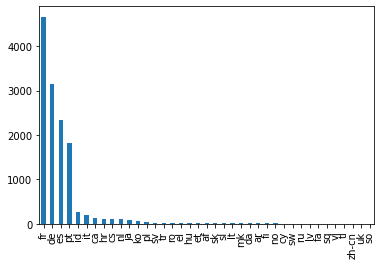

time: 399 ms (started: 2021-02-06 15:55:54 +00:00)


In [ ]:
import matplotlib.pyplot as plt

correct_foreign['lang'].value_counts().plot.bar()

In [ ]:
from deep_translator import GoogleTranslator

gglt = GoogleTranslator()

time: 133 ms (started: 2021-02-06 15:55:55 +00:00)


In [ ]:
def apply_lang(x):
    try:
        return gglt.translate(x)
    except:
        return x

time: 2.58 ms (started: 2021-02-06 15:55:55 +00:00)


In [ ]:
correct_foreign["abstract"] = correct_foreign["abstract"].progress_apply(apply_lang)

100%|██████████| 13318/13318 [44:40<00:00,  4.97it/s]

time: 44min 40s (started: 2021-02-06 15:55:55 +00:00)



/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [ ]:
correct_foreign.to_csv("foreign_words.csv")

time: 317 ms (started: 2021-02-06 17:37:11 +00:00)


In [ ]:
correct_foreign = pd.read_csv("foreign_words.csv")
correct_foreign

,paper_id,abstract,prop_foreign_word,lang
0,602342,"wireless, networks, after, wireless, lan, stan...",0.120690,de
1,695567,"This, article, how, with the help of standard ...",0.045455,de
2,831355,"automatic, index, selection, received, signifi...",0.413223,pt
3,858943,Monk,0.000000,zh-cn
4,889279,"Spatial, data, become, many, areas, multiple, ...",0.075630,de
5,1057596,"network, business, management, convergence, se...",0.420000,fr
6,1063698,"as, kent, beck, his, process model, extreme, p...",0.288136,de
7,1364438,"the, new, protocol, protocol, version, has, be...",0.250000,es
8,1471410,"lecture, the, security, networked, workshop, w...",0.153846,de
9,1564884,"So far, the necessary basic knowledge to under...",0.216216,de


time: 1.67 s (started: 2021-02-06 18:01:30 +00:00)


In [ ]:
# remove stopwords from translated words
correct_foreign["abstract"] = correct_foreign["abstract"].progress_apply(remove_stopwords)

100%|██████████| 13318/13318 [00:00<00:00, 46897.21it/s]

time: 291 ms (started: 2021-02-06 18:01:39 +00:00)


In [ ]:
del correct_foreign["lang"]
del correct_foreign["prop_foreign_word"]

time: 4.81 ms (started: 2021-02-06 18:01:39 +00:00)


In [ ]:
# to lower and remove commas
correct_foreign["abstract"] = correct_foreign["abstract"].progress_apply(
    lambda x: x.lower()
)

100%|██████████| 13318/13318 [00:00<00:00, 399978.09it/s]

time: 40.7 ms (started: 2021-02-06 18:01:40 +00:00)


In [ ]:
# remove punctuation marks
import string

allowed = {" "}.union(string.ascii_lowercase)

correct_foreign["abstract"] = correct_foreign["abstract"].progress_apply(
    lambda x: "".join(letter for letter in x if letter in allowed)
)

100%|██████████| 13318/13318 [00:01<00:00, 13126.19it/s]

time: 1.03 s (started: 2021-02-06 18:01:41 +00:00)


In [ ]:
correct_foreign["abstract"] = correct_foreign["abstract"].progress_apply(
    lambda x: ",".join(x.split(" "))
)

100%|██████████| 13318/13318 [00:00<00:00, 98429.70it/s] 

time: 146 ms (started: 2021-02-06 18:03:26 +00:00)


In [ ]:
correct_foreign["abstract"] = correct_foreign["abstract"].progress_apply(
    lambda x: x if not x or x[0] != "," else x[1:]
)

100%|██████████| 13318/13318 [00:00<00:00, 471334.53it/s]

time: 35.1 ms (started: 2021-02-06 18:04:11 +00:00)


In [ ]:
correct_foreign

,paper_id,abstract
0,602342,"wireless,networks,after,wireless,lan,standard,..."
1,695567,"this,article,how,with,the,help,of,standard,pro..."
2,831355,"automatic,index,selection,received,significant..."
3,858943,monk
4,889279,"spatial,data,become,many,areas,multiple,often,..."
5,1057596,"network,business,management,convergence,seen,n..."
6,1063698,"kent,beck,his,process,model,extreme,programmin..."
7,1364438,"new,protocol,protocol,version,has,been,develop..."
8,1471410,"lecture,the,security,networked,workshop,within..."
9,1564884,"so,far,the,necessary,basic,knowledge,to,unders..."


time: 1.13 s (started: 2021-02-06 18:04:13 +00:00)


In [ ]:
correct_foreign.set_index("paper_id", inplace=True)

time: 5.27 ms (started: 2021-02-06 18:08:03 +00:00)


In [ ]:
overall_words = pd.concat([english_words_concat, correct_foreign])
overall_words

,abstract
paper_id,
1281918,"article,describes,state,art,cloud,focusing,fea..."
1461187,"paper,describes,elements,inspection,allocation..."
1695099,"activating,communities,internet,catching,atten..."
2522900,"procedures,described,synthesis,segmental,aspec..."
2751201,"agile,software,development,methods,often,adver..."
...,...
2908211957,"the,execution,history,of,the,past,ladder,progr..."
2908239359,"management,server,based,linux,debian,and,ubunt..."
2908298801,"the,invention,creates,an,access,control,system..."


time: 118 ms (started: 2021-02-06 18:10:02 +00:00)


In [ ]:
overall_words.to_csv("paper_id_to_abstract_translated.csv")

time: 21.9 s (started: 2021-02-06 18:10:36 +00:00)
